# Import library & Reading data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

In [2]:
train_df = pd.read_csv('Train.csv')

In [3]:
train_df.head()

,text,label
0,I grew up (b. 1965) watching and loving the Th...,0
1,"When I put this movie in my DVD player, and sa...",0
2,Why do people who do not know what a particula...,0
3,Even though I have great interest in Biblical ...,0
4,Im a die hard Dads Army fan and nothing will e...,1


In [4]:
train_df.tail()

,text,label
39995,"""Western Union"" is something of a forgotten cl...",1
39996,This movie is an incredible piece of work. It ...,1
39997,My wife and I watched this movie because we pl...,0
39998,"When I first watched Flatliners, I was amazed....",1
39999,"Why would this film be so good, but only gross...",1


In [5]:
train_df.shape

(40000, 2)

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    40000 non-null  object
 1   label   40000 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 625.1+ KB


In [7]:
train_df.isnull().sum()

text     0
label    0
dtype: int64

In [8]:
train_df.duplicated().sum()

277

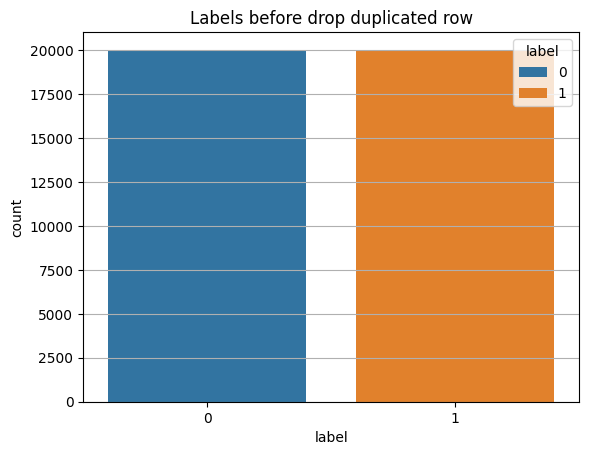

In [9]:
plt.grid()
sns.countplot(x=train_df['label'], hue=train_df['label'])
plt.title('Labels before drop duplicated row')
plt.show()

In [10]:
train_df.drop_duplicates(inplace = True)

In [11]:
train_df.reset_index(inplace=True)

In [12]:
train_df.drop('index', inplace = True, axis = 1)

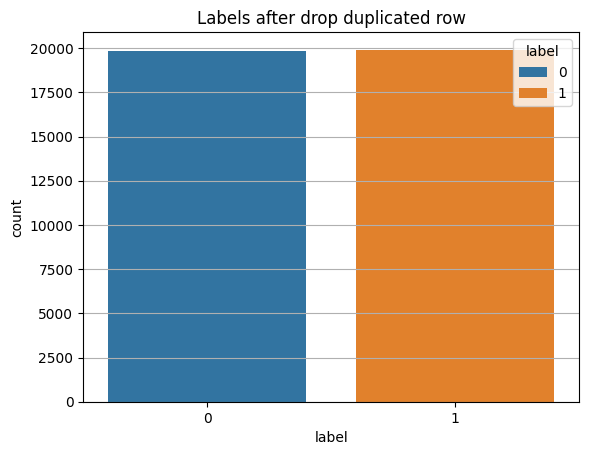

In [13]:
plt.grid()
sns.countplot(x=train_df['label'], hue=train_df['label'])
plt.title('Labels after drop duplicated row')
plt.show()

*********************************************************************************************

# Data Cleaning and Preprcessing

                                                        Convert all the data to lower case

In [14]:
train_df = train_df.applymap(lambda x: x.lower() if isinstance(x, str) else x)

In [15]:
train_df.head()

,text,label
0,i grew up (b. 1965) watching and loving the th...,0
1,"when i put this movie in my dvd player, and sa...",0
2,why do people who do not know what a particula...,0
3,even though i have great interest in biblical ...,0
4,im a die hard dads army fan and nothing will e...,1


                                                            Take a look to first 3 rows

In [16]:
for i in range(3):
  display(train_df['text'][i])

'i grew up (b. 1965) watching and loving the thunderbirds. all my mates at school watched. we played "thunderbirds" before school, during lunch and after school. we all wanted to be virgil or scott. no one wanted to be alan. counting down from 5 became an art form. i took my children to see the movie hoping they would get a glimpse of what i loved as a child. how bitterly disappointing. the only high point was the snappy theme tune. not that it could compare with the original score of the thunderbirds. thankfully early saturday mornings one television channel still plays reruns of the series gerry anderson and his wife created. jonatha frakes should hand in his directors chair, his version was completely hopeless. a waste of film. utter rubbish. a cgi remake may be acceptable but replacing marionettes with homo sapiens subsp. sapiens was a huge error of judgment.'

"when i put this movie in my dvd player, and sat down with a coke and some chips, i had some expectations. i was hoping that this movie would contain some of the strong-points of the first movie: awsome animation, good flowing story, excellent voice cast, funny comedy and a kick-ass soundtrack. but, to my disappointment, not any of this is to be found in atlantis: milo's return. had i read some reviews first, i might not have been so let down. the following paragraph will be directed to those who have seen the first movie, and who enjoyed it primarily for the points mentioned.<br /><br />when the first scene appears, your in for a shock if you just picked atlantis: milo's return from the display-case at your local videoshop (or whatever), and had the expectations i had. the music feels as a bad imitation of the first movie, and the voice cast has been replaced by a not so fitting one. (with the exception of a few characters, like the voice of sweet). the actual drawings isnt that bad, 

'why do people who do not know what a particular time in the past was like feel the need to try to define that time for others? replace woodstock with the civil war and the apollo moon-landing with the titanic sinking and you\'ve got as realistic a flick as this formulaic soap opera populated entirely by low-life trash. is this what kids who were too young to be allowed to go to woodstock and who failed grade school composition do? "i\'ll show those old meanies, i\'ll put out my own movie and prove that you don\'t have to know nuttin about your topic to still make money!" yeah, we already know that. the one thing watching this film did for me was to give me a little insight into underclass thinking. the next time i see a slut in a bar who looks like diane lane, i\'m running the other way. it\'s child abuse to let parents that worthless raise kids. it\'s audience abuse to simply stick woodstock and the moonlanding into a flick as if that ipso facto means the film portrays 1969.'

                                                Made a new column contain the number of letter in every row

In [17]:
train_df['letter_count'] = train_df['text'].apply(len)

In [18]:
train_df.head(3)

,text,label,letter_count
0,i grew up (b. 1965) watching and loving the th...,0,874
1,"when i put this movie in my dvd player, and sa...",0,1811
2,why do people who do not know what a particula...,0,983


In [19]:
train_df.iloc[train_df['letter_count'].idxmax()]

text            match 1: tag team table match bubba ray and sp...
label                                                           1
letter_count                                                13704
Name: 6370, dtype: object

                                                        Remove numbers and every strang symbol

In [3]:
import re

def remove_strang(data):

    for i in range(len(data)):

      text = data[i]

      text = re.sub("[^a-z\s\']", "", text)

      pattern = r'\b\w*(\w)\1{2, }\w*\\b|\b\w{1}\b'

      data[i] = re.sub(pattern, '', text)

    return data



In [21]:
text = remove_strang(train_df['text'])

In [23]:
text

0         grew up   watching and loving the thunderbird...
1        when  put this movie in my dvd player and sat ...
2        why do people who do not know what  particular...
3        even though  have great interest in biblical m...
4        im  die hard dads army fan and nothing will ev...
                               ...                        
39718    western union is something of  forgotten class...
39719    this movie is an incredible piece of work it e...
39720    my wife and  watched this movie because we pla...
39721    when  first watched flatliners  was amazed it ...
39722    why would this film be so good but only gross ...
Name: text, Length: 39723, dtype: object

In [24]:
for i in range(3):

  display(text[i])

' grew up   watching and loving the thunderbirds all my mates at school watched we played thunderbirds before school during lunch and after school we all wanted to be virgil or scott no one wanted to be alan counting down from  became an art form  took my children to see the movie hoping they would get  glimpse of what  loved as  child how bitterly disappointing the only high point was the snappy theme tune not that it could compare with the original score of the thunderbirds thankfully early saturday mornings one television channel still plays reruns of the series gerry anderson and his wife created jonatha frakes should hand in his directors chair his version was completely hopeless  waste of film utter rubbish  cgi remake may be acceptable but replacing marionettes with homo sapiens subsp sapiens was  huge error of judgment'

"when  put this movie in my dvd player and sat down with  coke and some chips  had some expectations  was hoping that this movie would contain some of the strongpoints of the first movie awsome animation good flowing story excellent voice cast funny comedy and  kickass soundtrack but to my disappointment not any of this is to be found in atlantis milo' return had  read some reviews first  might not have been so let down the following paragraph will be directed to those who have seen the first movie and who enjoyed it primarily for the points mentionedbr br when the first scene appears your in for  shock if you just picked atlantis milo' return from the displaycase at your local videoshop or whatever and had the expectations  had the music feels as  bad imitation of the first movie and the voice cast has been replaced by  not so fitting one with the exception of  few characters like the voice of sweet the actual drawings isnt that bad but the animation in particular is  sad sight the st

"why do people who do not know what  particular time in the past was like feel the need to try to define that time for others replace woodstock with the civil war and the apollo moonlanding with the titanic sinking and you've got as realistic  flick as this formulaic soap opera populated entirely by lowlife trash is this what kids who were too young to be allowed to go to woodstock and who failed grade school composition do 'll show those old meanies 'll put out my own movie and prove that you don' have to know nuttin about your topic to still make money yeah we already know that the one thing watching this film did for me was to give me  little insight into underclass thinking the next time  see  slut in  bar who looks like diane lane ' running the other way it' child abuse to let parents that worthless raise kids it' audience abuse to simply stick woodstock and the moonlanding into  flick as if that ipso facto means the film portrays "

In [25]:
text[0]

' grew up   watching and loving the thunderbirds all my mates at school watched we played thunderbirds before school during lunch and after school we all wanted to be virgil or scott no one wanted to be alan counting down from  became an art form  took my children to see the movie hoping they would get  glimpse of what  loved as  child how bitterly disappointing the only high point was the snappy theme tune not that it could compare with the original score of the thunderbirds thankfully early saturday mornings one television channel still plays reruns of the series gerry anderson and his wife created jonatha frakes should hand in his directors chair his version was completely hopeless  waste of film utter rubbish  cgi remake may be acceptable but replacing marionettes with homo sapiens subsp sapiens was  huge error of judgment'

In [26]:
len(text)

39723

                                                                Make a Tokenization

In [4]:
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize, sent_tokenize


def tokenization(text):

        token_text = []
        for i in range(len(text)):
            texts = text[i]
            token_texts = word_tokenize(texts)
            token_text.append(token_texts)
        return token_text



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [28]:
tokenize_text = tokenization(text)

In [29]:
tokenize_text

[['grew',
  'up',
  'watching',
  'and',
  'loving',
  'the',
  'thunderbirds',
  'all',
  'my',
  'mates',
  'at',
  'school',
  'watched',
  'we',
  'played',
  'thunderbirds',
  'before',
  'school',
  'during',
  'lunch',
  'and',
  'after',
  'school',
  'we',
  'all',
  'wanted',
  'to',
  'be',
  'virgil',
  'or',
  'scott',
  'no',
  'one',
  'wanted',
  'to',
  'be',
  'alan',
  'counting',
  'down',
  'from',
  'became',
  'an',
  'art',
  'form',
  'took',
  'my',
  'children',
  'to',
  'see',
  'the',
  'movie',
  'hoping',
  'they',
  'would',
  'get',
  'glimpse',
  'of',
  'what',
  'loved',
  'as',
  'child',
  'how',
  'bitterly',
  'disappointing',
  'the',
  'only',
  'high',
  'point',
  'was',
  'the',
  'snappy',
  'theme',
  'tune',
  'not',
  'that',
  'it',
  'could',
  'compare',
  'with',
  'the',
  'original',
  'score',
  'of',
  'the',
  'thunderbirds',
  'thankfully',
  'early',
  'saturday',
  'mornings',
  'one',
  'television',
  'channel',
  'still',

In [30]:
tokenize_text[0]

['grew',
 'up',
 'watching',
 'and',
 'loving',
 'the',
 'thunderbirds',
 'all',
 'my',
 'mates',
 'at',
 'school',
 'watched',
 'we',
 'played',
 'thunderbirds',
 'before',
 'school',
 'during',
 'lunch',
 'and',
 'after',
 'school',
 'we',
 'all',
 'wanted',
 'to',
 'be',
 'virgil',
 'or',
 'scott',
 'no',
 'one',
 'wanted',
 'to',
 'be',
 'alan',
 'counting',
 'down',
 'from',
 'became',
 'an',
 'art',
 'form',
 'took',
 'my',
 'children',
 'to',
 'see',
 'the',
 'movie',
 'hoping',
 'they',
 'would',
 'get',
 'glimpse',
 'of',
 'what',
 'loved',
 'as',
 'child',
 'how',
 'bitterly',
 'disappointing',
 'the',
 'only',
 'high',
 'point',
 'was',
 'the',
 'snappy',
 'theme',
 'tune',
 'not',
 'that',
 'it',
 'could',
 'compare',
 'with',
 'the',
 'original',
 'score',
 'of',
 'the',
 'thunderbirds',
 'thankfully',
 'early',
 'saturday',
 'mornings',
 'one',
 'television',
 'channel',
 'still',
 'plays',
 'reruns',
 'of',
 'the',
 'series',
 'gerry',
 'anderson',
 'and',
 'his',
 'wife

In [31]:
len(tokenize_text)

39723

                                                                    Remove Stop word

In [5]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')

print(stopwords.words('english'))


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
negation_exceptions = {'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't",
                         'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't",
                         'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't",
                         'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't",
                         'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"}

In [7]:

def stopword_removal(tokenize_text):

    filtered_text = []

    for i in range(len(tokenize_text)):
        stop_words = set(stopwords.words('english'))
        stop_words.update('br')
        stop_words.remove('not')
        stop_words.remove('no')

        stop_words = stop_words - negation_exceptions

        filtered_sentence = [word for word in tokenize_text[i] if word.lower() not in stop_words]

        filtered_text.append(filtered_sentence)

    return filtered_text



In [35]:
filtered_text = stopword_removal(tokenize_text)

In [36]:
filtered_text

[['grew',
  'watching',
  'loving',
  'thunderbirds',
  'mates',
  'school',
  'watched',
  'played',
  'thunderbirds',
  'school',
  'lunch',
  'school',
  'wanted',
  'virgil',
  'scott',
  'no',
  'one',
  'wanted',
  'alan',
  'counting',
  'became',
  'art',
  'form',
  'took',
  'children',
  'see',
  'movie',
  'hoping',
  'would',
  'get',
  'glimpse',
  'loved',
  'child',
  'bitterly',
  'disappointing',
  'high',
  'point',
  'snappy',
  'theme',
  'tune',
  'not',
  'could',
  'compare',
  'original',
  'score',
  'thunderbirds',
  'thankfully',
  'early',
  'saturday',
  'mornings',
  'one',
  'television',
  'channel',
  'still',
  'plays',
  'reruns',
  'series',
  'gerry',
  'anderson',
  'wife',
  'created',
  'jonatha',
  'frakes',
  'hand',
  'directors',
  'chair',
  'version',
  'completely',
  'hopeless',
  'waste',
  'film',
  'utter',
  'rubbish',
  'cgi',
  'remake',
  'may',
  'acceptable',
  'replacing',
  'marionettes',
  'homo',
  'sapiens',
  'subsp',
  's

In [37]:
filtered_text[0]

['grew',
 'watching',
 'loving',
 'thunderbirds',
 'mates',
 'school',
 'watched',
 'played',
 'thunderbirds',
 'school',
 'lunch',
 'school',
 'wanted',
 'virgil',
 'scott',
 'no',
 'one',
 'wanted',
 'alan',
 'counting',
 'became',
 'art',
 'form',
 'took',
 'children',
 'see',
 'movie',
 'hoping',
 'would',
 'get',
 'glimpse',
 'loved',
 'child',
 'bitterly',
 'disappointing',
 'high',
 'point',
 'snappy',
 'theme',
 'tune',
 'not',
 'could',
 'compare',
 'original',
 'score',
 'thunderbirds',
 'thankfully',
 'early',
 'saturday',
 'mornings',
 'one',
 'television',
 'channel',
 'still',
 'plays',
 'reruns',
 'series',
 'gerry',
 'anderson',
 'wife',
 'created',
 'jonatha',
 'frakes',
 'hand',
 'directors',
 'chair',
 'version',
 'completely',
 'hopeless',
 'waste',
 'film',
 'utter',
 'rubbish',
 'cgi',
 'remake',
 'may',
 'acceptable',
 'replacing',
 'marionettes',
 'homo',
 'sapiens',
 'subsp',
 'sapiens',
 'huge',
 'error',
 'judgment']

In [38]:
len(filtered_text)

39723

                                                                Make a Stemming

In [8]:
from nltk.stem import PorterStemmer



def Stemming(filtered_text):

    ps = PorterStemmer()

    stemm_text = []

    for i in range(len(filtered_text)):
      stemm_word = [ps.stem(word) for word in filtered_text[i]]
      stemm_text.append(stemm_word)

    return stemm_text



In [40]:
stemm_text = Stemming(filtered_text)

In [41]:
len(stemm_text)

39723

In [42]:
stemm_text

[['grew',
  'watch',
  'love',
  'thunderbird',
  'mate',
  'school',
  'watch',
  'play',
  'thunderbird',
  'school',
  'lunch',
  'school',
  'want',
  'virgil',
  'scott',
  'no',
  'one',
  'want',
  'alan',
  'count',
  'becam',
  'art',
  'form',
  'took',
  'children',
  'see',
  'movi',
  'hope',
  'would',
  'get',
  'glimps',
  'love',
  'child',
  'bitterli',
  'disappoint',
  'high',
  'point',
  'snappi',
  'theme',
  'tune',
  'not',
  'could',
  'compar',
  'origin',
  'score',
  'thunderbird',
  'thank',
  'earli',
  'saturday',
  'morn',
  'one',
  'televis',
  'channel',
  'still',
  'play',
  'rerun',
  'seri',
  'gerri',
  'anderson',
  'wife',
  'creat',
  'jonatha',
  'frake',
  'hand',
  'director',
  'chair',
  'version',
  'complet',
  'hopeless',
  'wast',
  'film',
  'utter',
  'rubbish',
  'cgi',
  'remak',
  'may',
  'accept',
  'replac',
  'marionett',
  'homo',
  'sapien',
  'subsp',
  'sapien',
  'huge',
  'error',
  'judgment'],
 ['put',
  'movi',
  'd

In [43]:
stemm_text[0]

['grew',
 'watch',
 'love',
 'thunderbird',
 'mate',
 'school',
 'watch',
 'play',
 'thunderbird',
 'school',
 'lunch',
 'school',
 'want',
 'virgil',
 'scott',
 'no',
 'one',
 'want',
 'alan',
 'count',
 'becam',
 'art',
 'form',
 'took',
 'children',
 'see',
 'movi',
 'hope',
 'would',
 'get',
 'glimps',
 'love',
 'child',
 'bitterli',
 'disappoint',
 'high',
 'point',
 'snappi',
 'theme',
 'tune',
 'not',
 'could',
 'compar',
 'origin',
 'score',
 'thunderbird',
 'thank',
 'earli',
 'saturday',
 'morn',
 'one',
 'televis',
 'channel',
 'still',
 'play',
 'rerun',
 'seri',
 'gerri',
 'anderson',
 'wife',
 'creat',
 'jonatha',
 'frake',
 'hand',
 'director',
 'chair',
 'version',
 'complet',
 'hopeless',
 'wast',
 'film',
 'utter',
 'rubbish',
 'cgi',
 'remak',
 'may',
 'accept',
 'replac',
 'marionett',
 'homo',
 'sapien',
 'subsp',
 'sapien',
 'huge',
 'error',
 'judgment']

                                                            Make a cleaned and preprocessed Dataset

In [9]:
def make_df(stemm_text):

    text = []

    for i in range(len(stemm_text)):
      word_list = stemm_text[i]
      sentence = ' '.join(word_list)
      text.append(sentence)

    return text



In [45]:
train_df['text'] = pd.DataFrame(make_df(stemm_text))

In [46]:
train_df.head(4)

,text,label,letter_count
0,grew watch love thunderbird mate school watch ...,0,874
1,put movi dvd player sat coke chip expect hope ...,0,1811
2,peopl not know particular time past like feel ...,0,983
3,even though great interest biblic movi bore de...,0,351


In [47]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39723 entries, 0 to 39722
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   text          39723 non-null  object
 1   label         39723 non-null  int64 
 2   letter_count  39723 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 931.1+ KB


In [48]:
train_df.iloc[train_df['letter_count'].idxmax()]

text            match tag team tabl match bubba ray spike dudl...
label                                                           1
letter_count                                                13704
Name: 6370, dtype: object

*****************************************************************

                                                             Encoding

In [49]:
X = train_df['text']
y = train_df['label']

In [10]:
from sklearn.model_selection import train_test_split

X_train, X_test , y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

## CountVectorizer

In [11]:
from sklearn.feature_extraction.text import CountVectorizer

count_vectorizer = CountVectorizer()

#### *** MultinomialNB ***
*****************************************************

In [11]:
from sklearn.naive_bayes import MultinomialNB

multi_model = MultinomialNB()

In [12]:
from sklearn.pipeline import Pipeline

pipeline = Pipeline([('vectorizer', count_vectorizer),
                     ('classifier', multi_model)])

In [54]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', CountVectorizer()),
                ('classifier', MultinomialNB())])

In [55]:
y_pred = pipeline.predict(X_test)

In [12]:
from sklearn.metrics import accuracy_score

multi_accuracy = accuracy_score(y_pred, y_test)

print(multi_accuracy)

#### *** DecisionTree ***
******************************************************************

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dec_tree_model = DecisionTreeClassifier()

In [ ]:
pipeline = Pipeline([('vectorizer', count_vectorizer),
                     ('classifier', dec_tree_model)])

In [ ]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', CountVectorizer()),
                ('classifier', DecisionTreeClassifier())])

In [ ]:
y_pred = pipeline.predict(X_test)

In [ ]:
dec_tree_accuracy = accuracy_score(y_pred, y_test)
print(dec_tree_accuracy)

0.7254877281308999


#### *** Random forest ***
******************************************************************

In [ ]:
from sklearn.ensemble import RandomForestClassifier

RF_model = RandomForestClassifier()

In [ ]:
pipeline = Pipeline([('vectorizer', count_vectorizer),
                     ('classifier', RF_model)])

In [ ]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', CountVectorizer()),
                ('classifier', RandomForestClassifier())])

In [ ]:
y_pred = pipeline.predict(X_test)

In [ ]:
RF_accuracy = accuracy_score(y_pred, y_test)
print(RF_accuracy)

0.855254877281309


#### *** XGBoost ***
******************************************************************

In [ ]:
import xgboost as xgb

xgb_model = xgb.XGBClassifier()

In [ ]:
pipeline = Pipeline([('vectorizer', count_vectorizer),
                     ('classifier', xgb_model)])

In [ ]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', CountVectorizer()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [ ]:
y_pred = pipeline.predict(X_test)

In [ ]:
xgb_accuracy = accuracy_score(y_pred, y_test)

print(xgb_accuracy)

0.8556324732536186


**************************************

In [ ]:
models = ['MultinomialNB', 'DecisionTree', 'Random forest', 'XGBoost']

In [ ]:
scores = [multi_accuracy, dec_tree_accuracy, RF_accuracy, xgb_accuracy]

In [ ]:
scores

[0.8529893014474512, 0.7254877281308999, 0.855254877281309, 0.8556324732536186]

In [ ]:
df = {'model':models, 'score':scores}

In [ ]:
df = pd.DataFrame(df)

In [ ]:
df

,model,score
0,MultinomialNB,0.852989
1,DecisionTree,0.725488
2,Random forest,0.855255
3,XGBoost,0.855632


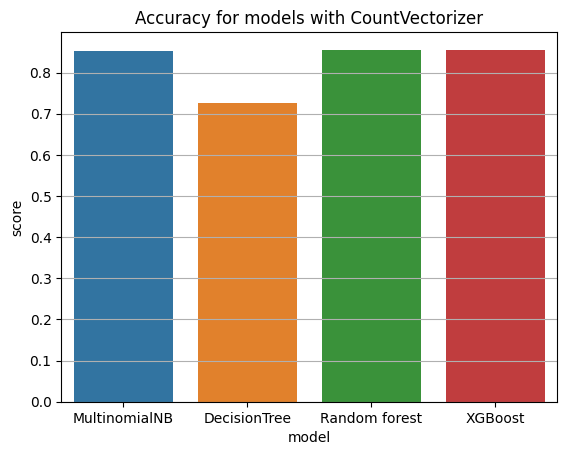

In [ ]:
plt.grid()

sns.barplot(x = 'model', y = 'score', hue = 'model', data = df)
plt.title('Accuracy for models with CountVectorizer')
plt.show()

***************************************************************

## TfidfVectorizer

In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer

TFidf_vectorizer = TfidfVectorizer()

#### *** MultinomialNB ***
******************************************************************

In [15]:

pipeline = Pipeline([('vectorizer', TFidf_vectorizer),
                     ('classifier', multi_model)])

In [59]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', TfidfVectorizer()),
                ('classifier', MultinomialNB())])

In [60]:
y_pred = pipeline.predict(X_test)

In [61]:
multi_accuracy_TFidf = accuracy_score(y_pred, y_test)

print(multi_accuracy_TFidf)

0.8605412208936438


#### *** DecisionTree ***
******************************************************************

In [ ]:
pipeline = Pipeline([('vectorizer', TFidf_vectorizer),
                     ('classifier', dec_tree_model)])

In [ ]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', TfidfVectorizer()),
                ('classifier', DecisionTreeClassifier())])

In [ ]:
y_pred = pipeline.predict(X_test)

In [ ]:
dec_accuracy_TFidf = accuracy_score(y_pred, y_test)

print(dec_accuracy_TFidf)

0.7156702328508496


#### *** Random forest ***
******************************************************************

In [ ]:
pipeline = Pipeline([('vectorizer', TFidf_vectorizer),
                     ('classifier', RF_model)])

In [ ]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', TfidfVectorizer()),
                ('classifier', RandomForestClassifier())])

In [ ]:
y_pred = pipeline.predict(X_test)

In [ ]:
RF_sccracy_TFidf = accuracy_score(y_pred, y_test)

print(RF_sccracy_TFidf)

0.8483322844556325


#### *** XGBoost ***
******************************************************************

In [ ]:
pipeline = Pipeline([('vectorizer', TFidf_vectorizer),
                     ('classifier', xgb_model)])

In [ ]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', TfidfVectorizer()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [ ]:
y_pred = pipeline.predict(X_test)

In [ ]:
xgb_accuracy_TFidf = accuracy_score(y_pred, y_test)

print(xgb_accuracy_TFidf)

0.8521082441787288


*************************************************************

In [ ]:
TFidf_scores = [multi_accuracy_TFidf, dec_accuracy_TFidf, RF_sccracy_TFidf, xgb_accuracy_TFidf]

In [ ]:
TFidf_scores

[0.8605412208936438,
 0.7156702328508496,
 0.8483322844556325,
 0.8521082441787288]

In [ ]:
df2 = {'model':models, 'score':TFidf_scores}

In [ ]:
df2 = pd.DataFrame(df2)

In [ ]:
df2

,model,score
0,MultinomialNB,0.860541
1,DecisionTree,0.715670
2,Random forest,0.848332
3,XGBoost,0.852108


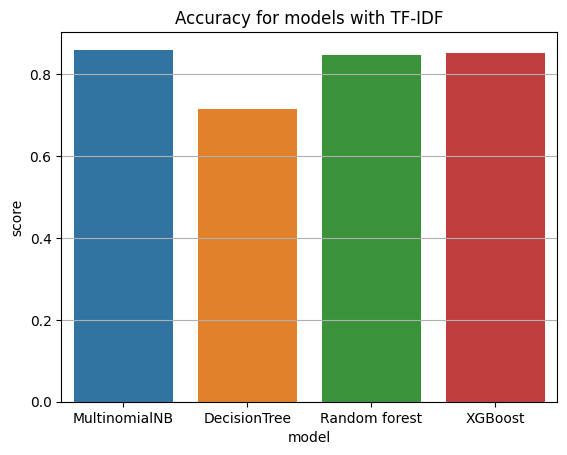

In [ ]:
plt.grid()
sns.barplot(x = 'model', y = 'score', hue = 'model', data = df2)
plt.title('Accuracy for models with TF-IDF')
plt.show()

##### The best model is * MultinomialNB * with TF-IDF feature extraction

***************************************************************

## Developed the Model

In [62]:
n = 50
acc_list = []
random = []
for i in range(n):

    random.append(i)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = i)

    pipeline_model = Pipeline([('vectorizer', TFidf_vectorizer),
                                 ('classifier', multi_model)])

    pipeline_model.fit(X_train, y_train)

    y_prd = pipeline_model.predict(X_test)
    acc_list.append(accuracy_score(y_pred, y_test))

In [63]:
acc_df = {'random_state':random, 'accuracy':acc_list}

In [64]:
acc_df = pd.DataFrame(acc_df)

In [65]:
acc_df.iloc[acc_df['accuracy'].idxmax()]

random_state    42.000000
accuracy         0.860541
Name: 42, dtype: float64

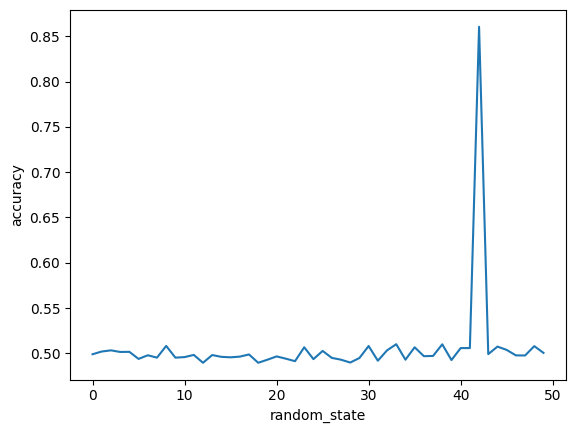

In [66]:
sns.lineplot(x = 'random_state', y = 'accuracy', data = acc_df)
plt.show()

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)


In [68]:
pipeline_model = Pipeline([('vectorizer', TFidf_vectorizer),
                           ('classifier', multi_model)])

In [69]:
from sklearn.model_selection import cross_val_score, KFold

num_folds = 5

kf_model = KFold(n_splits=num_folds, shuffle=True, random_state=42)

cross_val_results = cross_val_score(pipeline_model, X, y, cv=kf_model)


In [70]:
print(f'Cross-Validation Results (Accuracy): {cross_val_results}')
print(f'Mean Accuracy: {cross_val_results.mean()}')


Cross-Validation Results (Accuracy): [0.86054122 0.86117055 0.86028949 0.86555891 0.85146022]
Mean Accuracy: 0.8598040785181608


In [73]:
pipeline_model.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', TfidfVectorizer()),
                ('classifier', MultinomialNB())])

*******************************************************

In [14]:
def predict_df(data):


    data = data.applymap(lambda x: x.lower() if isinstance(x, str) else x)

    text = remove_strang(data['text'])

    tokenize_text = tokenization(text)

    filtered_text = stopword_removal(tokenize_text)

    stemm_text = Stemming(filtered_text)

    data['text'] = pd.DataFrame(make_df(stemm_text))

    X = data['text']

    y_pred = pipeline_model.predict(X)

    return y_pred

**************************************************

In [75]:
val_data = pd.read_csv('Valid.csv')
val_data

,text,label
0,It's been about 14 years since Sharon Stone aw...,0
1,someone needed to make a car payment... this i...,0
2,The Guidelines state that a comment must conta...,0
3,This movie is a muddled mish-mash of clichés f...,0
4,Before Stan Laurel became the smaller half of ...,0
...,...,...
4995,"Man, I loved this movie! This really takes me ...",1
4996,Recovery is an incredibly moving piece of work...,1
4997,"You can take the crook out of the joint, but i...",1
4998,FUTZ is the only show preserved from the exper...,1


In [76]:
y_pred = predict_df(val_data)

In [77]:
y_pred

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

In [78]:
val_acc = accuracy_score(y_pred, val_data['label'])

print(val_acc)

0.8584


In [79]:
submission = pd.read_csv('sample_submission.csv')
test_data = pd.read_csv('test.csv')

test_data

,id,text,label
0,0,I always wrote this series off as being a comp...,NaN
1,1,1st watched 12/7/2002 - 3 out of 10(Dir-Steve ...,NaN
2,2,This movie was so poorly written and directed ...,NaN
3,3,The most interesting thing about Miryang (Secr...,NaN
4,4,"when i first read about ""berlin am meer"" i did...",NaN
...,...,...,...
4995,4995,This is the kind of picture John Lassiter woul...,NaN
4996,4996,A MUST SEE! I saw WHIPPED at a press screening...,NaN
4997,4997,NBC should be ashamed. I wouldn't allow my chi...,NaN
4998,4998,This movie is a clumsy mishmash of various gho...,NaN


In [80]:
label = predict_df(test_data)

In [81]:
submission['label'] = label

In [82]:
submission.to_csv('mo3.csv', sep=',', index=False, encoding='utf-8')

*********************************************************************************

In [15]:
def predict_smple(sample):

    sample = sample.lower()

    sample = re.sub("[^a-z\s\']", "", sample)

    pattern = r'\b\w*(\w)\1{2, }\w*\\b|\b\w{1}\b'

    sample = re.sub(pattern, '', sample)

    token_sample = word_tokenize(sample)


    stop_words = set(stopwords.words('english'))
    stop_words.update('br')
    stop_words.remove('not')
    stop_words.remove('no')
    stop_words = stop_words - negation_exceptions
    filtered_sample = [word for word in token_sample if word not in stop_words]

    ps = PorterStemmer()
    stemm_text = [ps.stem(word) for word in filtered_sample]

    sample = ' '.join(stemm_text)

    sample = [sample]

    X = sample

    y = pipeline_model.predict(X)

    if y == 1:
        print('           Positive')
        img = Image.open('positive.png')

    elif y == 0:
        print('           Negative')
        img = Image.open('negative.png')


    return display(img)


           Positive


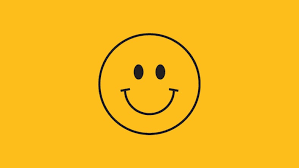

None


In [84]:
sample1 = "he love it"
print(predict_smple(sample1))

           Negative


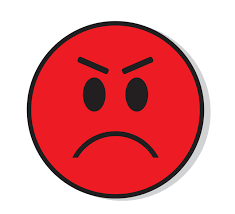

None


In [85]:
sample2 = "he dont love it"
print(predict_smple(sample2))

*******************************************************************************************

# LSTM Model

In [16]:
import tensorflow as tf
import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

#### Read and preparation the trainning, valedation and testing data

In [17]:
train_df2 = pd.read_csv('Train.csv')

In [18]:
train_df2.drop_duplicates(inplace = True)

In [19]:
train_df2.reset_index(inplace = True)

In [20]:
train_df2.head()

,index,text,label
0,0,I grew up (b. 1965) watching and loving the Th...,0
1,1,"When I put this movie in my DVD player, and sa...",0
2,2,Why do people who do not know what a particula...,0
3,3,Even though I have great interest in Biblical ...,0
4,4,Im a die hard Dads Army fan and nothing will e...,1


In [21]:
train_df2.drop('index', axis = 1, inplace = True)

In [22]:
train_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39723 entries, 0 to 39722
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    39723 non-null  object
 1   label   39723 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 620.8+ KB


In [23]:
def processing_df(data):


    data = data.applymap(lambda x: x.lower() if isinstance(x, str) else x)

    text = remove_strang(data['text'])

    tokenize_text = tokenization(text)

    filtered_text = stopword_removal(tokenize_text)

    stemm_text = Stemming(filtered_text)

    data['text'] = pd.DataFrame(make_df(stemm_text))

    return data

In [24]:
train_df2 = processing_df(train_df2)

In [25]:
train_df2.head()

,text,label
0,grew watch love thunderbird mate school watch ...,0
1,put movi dvd player sat coke chip expect hope ...,0
2,peopl not know particular time past like feel ...,0
3,even though great interest biblic movi bore de...,0
4,im die hard dad armi fan noth ever chang got t...,1


In [26]:
train_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39723 entries, 0 to 39722
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    39723 non-null  object
 1   label   39723 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 620.8+ KB


In [27]:
train_df2['label'].value_counts()

label
1    19908
0    19815
Name: count, dtype: int64

In [28]:
val_df2 = pd.read_csv('Valid.csv')
val_df2.head()

,text,label
0,It's been about 14 years since Sharon Stone aw...,0
1,someone needed to make a car payment... this i...,0
2,The Guidelines state that a comment must conta...,0
3,This movie is a muddled mish-mash of clichés f...,0
4,Before Stan Laurel became the smaller half of ...,0


In [29]:
val_df2 = processing_df(val_df2)
val_df2.head()

,text,label
0,' year sinc sharon stone award viewer legcross...,0
1,someon need make car payment truli aw make jea...,0
2,guidelin state comment must contain minimum fo...,0
3,movi muddl mishmash clich recent cinema promis...,0
4,stan laurel becam smaller half alltim greatest...,0


In [30]:
val_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    5000 non-null   object
 1   label   5000 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 78.3+ KB


In [31]:
val_df2['label'].value_counts()

label
1    2514
0    2486
Name: count, dtype: int64

In [32]:
add_df = pd.read_csv("IMDB Dataset.csv")
add_df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


In [33]:
add_df.rename(columns={"review": "text", "sentiment": "label"}, inplace = True)

In [34]:
add_df.head()

,text,label
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


In [35]:
add_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    50000 non-null  object
 1   label   50000 non-null  object
dtypes: object(2)
memory usage: 781.4+ KB


In [36]:
from sklearn import preprocessing 
  
label_encoder = preprocessing.LabelEncoder() 
  
add_df['label']= label_encoder.fit_transform(add_df['label']) 

In [37]:
add_df.head()

,text,label
0,One of the other reviewers has mentioned that ...,1
1,A wonderful little production. <br /><br />The...,1
2,I thought this was a wonderful way to spend ti...,1
3,Basically there's a family where a little boy ...,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",1


In [38]:
add_df = processing_df(add_df)

In [39]:
add_df.head()

,text,label
0,one review mention watch oz episod 'll hook ri...,1
1,wonder littl product br br film techniqu unass...,1
2,thought wonder way spend time hot summer weeke...,1
3,basic ' famili littl boy jake think ' zombi cl...,0
4,petter mattei ' love time money visual stun fi...,1


In [40]:
concatenated_df = pd.concat([train_df2, add_df], axis=0)

concatenated_df.reset_index(drop=True, inplace=True)

In [41]:
concatenated_df

,text,label
0,grew watch love thunderbird mate school watch ...,0
1,put movi dvd player sat coke chip expect hope ...,0
2,peopl not know particular time past like feel ...,0
3,even though great interest biblic movi bore de...,0
4,im die hard dad armi fan noth ever chang got t...,1
...,...,...
89718,thought movi right good job wasn ' creativ ori...,1
89719,bad plot bad dialogu bad act idiot direct anno...,0
89720,cathol taught parochi elementari school nun ta...,0
89721,' go disagre previou comment side maltin one s...,0


In [42]:
train_df2 = concatenated_df

In [43]:
train_df2.head()

,text,label
0,grew watch love thunderbird mate school watch ...,0
1,put movi dvd player sat coke chip expect hope ...,0
2,peopl not know particular time past like feel ...,0
3,even though great interest biblic movi bore de...,0
4,im die hard dad armi fan noth ever chang got t...,1


#### Hyperparameters of the model

In [44]:
vocab_size = 3000 # the maximum number of unique words to consider.

oov_tok = ''    # This represents the out-of-vocabulary token.

embedding_dim = 100  #Each word will be represented by a vector of this size.

max_length = 200 # This defines the maximum length of input sequences. 
                   # Text sequences longer than this will be truncated, and shorter sequences will be padded.

padding_type='post'
trunc_type='post'

# tokenize sentences
tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(train_df2['text'])
word_index = tokenizer.word_index

# convert train dataset to sequence and pad sequences
X_train = tokenizer.texts_to_sequences(train_df2['text'])
X_train = pad_sequences(X_train, padding='post', maxlen=max_length)

# convert Test dataset to sequence and pad sequences
X_val = tokenizer.texts_to_sequences(val_df2['text'])
X_val = pad_sequences(X_val, padding='post', maxlen=max_length)


y_train = train_df2['label']
y_val = val_df2['label']

In [45]:
y_train = tf.keras.utils.to_categorical(y_train, num_classes=2)
y_val = tf.keras.utils.to_categorical(y_val, num_classes=2)

In [391]:
# Define a Callback class that stops training once accuracy reaches 99.0%
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('accuracy')>0.99):
            print("\nReached 95.0% accuracy so cancelling training!")
            self.model.stop_training = True
callback = myCallback()


In [131]:
model = keras.Sequential([
    
    keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    keras.layers.Bidirectional(keras.layers.LSTM(100, dropout=0.2, recurrent_dropout=0.2)),
    keras.layers.Dense(24, activation='relu'),
    keras.layers.Dense(2, activation='sigmoid')
])



model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])


model.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_19 (Embedding)    (None, 200, 100)          300000    
                                                                 
 bidirectional_10 (Bidirect  (None, 200)               160800    
 ional)                                                          
                                                                 
 dense_47 (Dense)            (None, 24)                4824      
                                                                 
 dense_48 (Dense)            (None, 2)                 50        
                                                                 
Total params: 465674 (1.78 MB)
Trainable params: 465674 (1.78 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [132]:
history = model.fit(X_train, y_train, epochs=2, 
                              batch_size=32, validation_data=(X_val, y_val), 
                              callbacks=[callback])

Epoch 1/2
1242/1242 [==============================] - 896s 713ms/step - loss: 0.4193 - accuracy: 0.8101 - val_loss: 0.3242 - val_accuracy: 0.8662
Epoch 2/2
1242/1242 [==============================] - 867s 698ms/step - loss: 0.3328 - accuracy: 0.8665 - val_loss: 0.3215 - val_accuracy: 0.8696


In [133]:
y_prediction = model.predict(X_val)

pred_labels = np.argmax(y_prediction, axis=1)

model_acc =  accuracy_score(val_df2['label'], pred_labels)

print("Accuracy of prediction on val set (Model): ", model_acc)

157/157 [==============================] - 15s 92ms/step
Accuracy of prediction on val set (Model):  0.8696


In [134]:
model1 = keras.Sequential([
    keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    keras.layers.Bidirectional(keras.layers.LSTM(128, dropout=0.2, recurrent_dropout=0.2, return_sequences=True)),
    keras.layers.Bidirectional(keras.layers.LSTM(64, dropout=0.2, recurrent_dropout=0.2)),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dropout(0.5),  
    keras.layers.Dense(2, activation='sigmoid')
])


model1.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])


model1.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_20 (Embedding)    (None, 200, 100)          300000    
                                                                 
 bidirectional_11 (Bidirect  (None, 200, 256)          234496    
 ional)                                                          
                                                                 
 bidirectional_12 (Bidirect  (None, 128)               164352    
 ional)                                                          
                                                                 
 dense_49 (Dense)            (None, 64)                8256      
                                                                 
 dropout_24 (Dropout)        (None, 64)                0         
                                                                 
 dense_50 (Dense)            (None, 2)               

In [136]:
history = model1.fit(X_train, y_train, epochs=2, 
                              batch_size=32, validation_data=(X_val, y_val), 
                              callbacks=[callback])

Epoch 1/2
1242/1242 [==============================] - 2393s 2s/step - loss: 0.6391 - accuracy: 0.6456 - val_loss: 0.5995 - val_accuracy: 0.6842
Epoch 2/2
1242/1242 [==============================] - 2664s 2s/step - loss: 0.3853 - accuracy: 0.8330 - val_loss: 0.3149 - val_accuracy: 0.8702


In [137]:
y_prediction = model1.predict(X_val)

pred_labels = np.argmax(y_prediction, axis=1)

model1_acc =  accuracy_score(val_df2['label'], pred_labels)

print("Accuracy of prediction on val set (Model 1): ", model1_acc)

157/157 [==============================] - 58s 361ms/step
Accuracy of prediction on val set (Model 1):  0.8702


In [81]:
model2 = tf.keras.Sequential([
    
    tf.keras.layers.Embedding(input_dim = 5000, output_dim = 128, input_length = 200),
    tf.keras.layers.Conv1D(128, 5, activation='relu'),  # 1D Convolutional layer with 128 filters and kernel size 5
    tf.keras.layers.GlobalMaxPooling1D(),  # Global Max Pooling layer
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),  # Adding Dropout with dropout rate of 0.5
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dropout(0.5),  # Adding Dropout with dropout rate of 0.5
    tf.keras.layers.Dense(2, activation='sigmoid')
    
])


model2.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])


model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 200, 128)          640000    
                                                                 
 conv1d_3 (Conv1D)           (None, 196, 128)          82048     
                                                                 
 global_max_pooling1d_2 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_5 (Dense)             (None, 64)                8256      
                                                                 
 dropout_3 (Dropout)         (None, 64)                0         
                                                                 
 dense_6 (Dense)             (None, 32)                2080      
                                                      

In [82]:
history = model2.fit(X_train, y_train, epochs=10, 
                              batch_size=32, validation_split = 0.2)

Epoch 1/10
2244/2244 [==============================] - 144s 63ms/step - loss: 0.3654 - accuracy: 0.8420 - val_loss: 0.2529 - val_accuracy: 0.8956
Epoch 2/10
2244/2244 [==============================] - 130s 58ms/step - loss: 0.1905 - accuracy: 0.9330 - val_loss: 0.1579 - val_accuracy: 0.9445
Epoch 3/10
2244/2244 [==============================] - 123s 55ms/step - loss: 0.1048 - accuracy: 0.9656 - val_loss: 0.1352 - val_accuracy: 0.9595
Epoch 4/10
2244/2244 [==============================] - 131s 58ms/step - loss: 0.0603 - accuracy: 0.9806 - val_loss: 0.1457 - val_accuracy: 0.9601
Epoch 5/10
2244/2244 [==============================] - 133s 59ms/step - loss: 0.0442 - accuracy: 0.9849 - val_loss: 0.1764 - val_accuracy: 0.9681
Epoch 6/10
2244/2244 [==============================] - 137s 61ms/step - loss: 0.0341 - accuracy: 0.9889 - val_loss: 0.1814 - val_accuracy: 0.9676
Epoch 7/10
2244/2244 [==============================] - 133s 59ms/step - loss: 0.0295 - accuracy: 0.9898 - val_loss: 0

In [83]:
y_prediction = model2.predict(X_val)

pred_labels = np.argmax(y_prediction, axis=1)

model2_acc =  accuracy_score(val_df2['label'], pred_labels)

print("Accuracy of prediction on val set (Model 2): ", model2_acc)

157/157 [==============================] - 2s 14ms/step
Accuracy of prediction on val set (Model 2):  0.956


In [63]:
model_conv = tf.keras.Sequential([
    
    tf.keras.layers.Embedding(3000, 16, input_length=max_length),
    tf.keras.layers.Conv1D(128, 5, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv1D(64, 5, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='sigmoid')
])

model_conv.compile(loss='binary_crossentropy', 
                   optimizer='adam', metrics=['accuracy'])

model_conv.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 200, 16)           48000     
                                                                 
 conv1d_1 (Conv1D)           (None, 196, 128)          10368     
                                                                 
 batch_normalization (Batch  (None, 196, 128)          512       
 Normalization)                                                  
                                                                 
 conv1d_2 (Conv1D)           (None, 192, 64)           41024     
                                                                 
 batch_normalization_1 (Bat  (None, 192, 64)           256       
 chNormalization)                                                
                                                                 
 global_max_pooling1d_1 (Gl  (None, 64)               

In [65]:
history_conv = model_conv.fit(X_train, y_train, epochs=10, 
                              batch_size=32, validation_split = 0.2, )

Epoch 1/10
2244/2244 [==============================] - 117s 51ms/step - loss: 0.4361 - accuracy: 0.7898 - val_loss: 0.2755 - val_accuracy: 0.8848
Epoch 2/10
2244/2244 [==============================] - 127s 56ms/step - loss: 0.2671 - accuracy: 0.8954 - val_loss: 0.2384 - val_accuracy: 0.9018
Epoch 3/10
2244/2244 [==============================] - 115s 51ms/step - loss: 0.2026 - accuracy: 0.9262 - val_loss: 0.2129 - val_accuracy: 0.9150
Epoch 4/10
2244/2244 [==============================] - 113s 50ms/step - loss: 0.1486 - accuracy: 0.9469 - val_loss: 0.2099 - val_accuracy: 0.9231
Epoch 5/10
2244/2244 [==============================] - 112s 50ms/step - loss: 0.1098 - accuracy: 0.9624 - val_loss: 0.1632 - val_accuracy: 0.9491
Epoch 6/10
2244/2244 [==============================] - 113s 50ms/step - loss: 0.0822 - accuracy: 0.9717 - val_loss: 0.1707 - val_accuracy: 0.9522
Epoch 7/10
2244/2244 [==============================] - 124s 55ms/step - loss: 0.0700 - accuracy: 0.9757 - val_loss: 0

In [66]:
y_prediction = model_conv.predict(X_val)


pred_labels = np.argmax(y_prediction, axis=1)

model_conv_acc =  accuracy_score(val_df2['label'], pred_labels)

print("Accuracy of prediction on val set (Model_conv): ", model_conv_acc)

157/157 [==============================] - 2s 11ms/step
Accuracy of prediction on val set (Model_conv):  0.9402


In [145]:
models = ['model', 'model1', 'model2', 'model_conv']
acc = [model_acc, model1_acc, model2_acc, model_conv_acc]

In [146]:
df3 = {'Model':models, 'accuracy':acc}

In [147]:
df3 = pd.DataFrame(df3)
df3

,Model,accuracy
0,model,0.8696
1,model1,0.8702
2,model2,0.8746
3,model_conv,0.8578


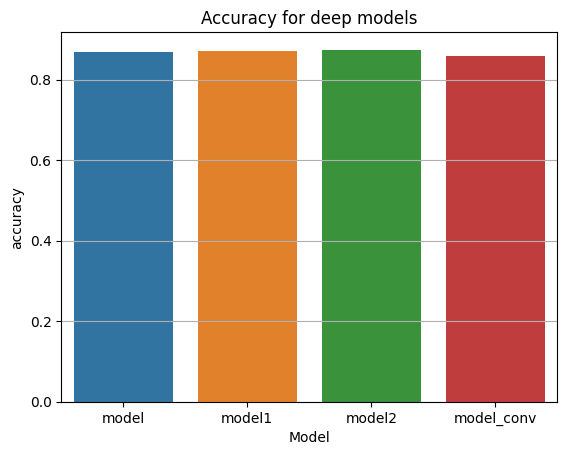

In [150]:
plt.grid()
sns.barplot(x = 'Model', y = 'accuracy', hue = 'Model', data = df3)
plt.title('Accuracy for deep models')
plt.show()

#### Try the best model on test data
*********************************************************

In [84]:
test_df = pd.read_csv('Test.csv')


In [85]:
test_df = processing_df(test_df)


In [86]:
test_df.head()


,id,text,label
0,0,alway wrote seri complet stinkfest jim belushi...,NaN
1,1,st watch dirstev purcel typic mari kate ashley...,NaN
2,2,movi poorli written direct fell asleep minut m...,NaN
3,3,interest thing miryang secret sunshin actor je...,NaN
4,4,first read berlin meer didn ' expect much thou...,NaN


In [87]:
test_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      5000 non-null   int64  
 1   text    5000 non-null   object 
 2   label   0 non-null      float64
dtypes: float64(1), int64(1), object(1)
memory usage: 117.3+ KB


In [88]:
test_df['label'].value_counts()

Series([], Name: count, dtype: int64)

In [89]:
X_test = test_df['text']

X_test = tokenizer.texts_to_sequences(X_test)

X_test = pad_sequences(X_test, padding='post', maxlen=max_length)


In [90]:
y_pred2 = []


y = model2.predict(X_test)

for i in y:
    if i[1] >= 0.5:
        y_pred2.append(1)
    else:
        y_pred2.append(0)


157/157 [==============================] - 2s 12ms/step


***************************************************************************

In [91]:
test_df['label'] = y_pred2

In [92]:
test_df.head()

,id,text,label
0,0,alway wrote seri complet stinkfest jim belushi...,0
1,1,st watch dirstev purcel typic mari kate ashley...,0
2,2,movi poorli written direct fell asleep minut m...,0
3,3,interest thing miryang secret sunshin actor je...,1
4,4,first read berlin meer didn ' expect much thou...,0


In [93]:
submission = pd.read_csv('sample_submission.csv')

In [94]:
submission.head()

,id,label
0,0,NaN
1,1,NaN
2,2,NaN
3,3,NaN
4,4,NaN


In [95]:
submission['label'] = test_df['label']

In [96]:
submission

,id,label
0,0,0
1,1,0
2,2,0
3,3,1
4,4,0
...,...,...
4995,4995,1
4996,4996,1
4997,4997,0
4998,4998,0


In [97]:
submission.to_csv('mo78.csv', sep=',', index=False, encoding='utf-8')

*********************************************

In [155]:
def predict_df_label(data):

      y_pred = []
    
      data = processing_df(data)
    
      X_train = tokenizer.texts_to_sequences(data['text'])
      X = pad_sequences(X_train, padding='post', maxlen=max_length)


      y = model2.predict(X)
    
      for i in y:
          if i[1] >= 0.5:
              y_pred.append(1)
          else:
              y_pred.append(0)

      return y_pred

**********************************************************************************

In [156]:
test_df = pd.read_csv('Test.csv')
test_df.head()

,id,text,label
0,0,I always wrote this series off as being a comp...,NaN
1,1,1st watched 12/7/2002 - 3 out of 10(Dir-Steve ...,NaN
2,2,This movie was so poorly written and directed ...,NaN
3,3,The most interesting thing about Miryang (Secr...,NaN
4,4,"when i first read about ""berlin am meer"" i did...",NaN


In [243]:
label = predict_df_label(test_df)

157/157 [==============================] - 2s 13ms/step


In [244]:
test_df['label'] = label

In [245]:
test_df.head()

,id,text,label
0,0,I always wrote this series off as being a comp...,0
1,1,1st watched 12/7/2002 - 3 out of 10(Dir-Steve ...,0
2,2,This movie was so poorly written and directed ...,0
3,3,The most interesting thing about Miryang (Secr...,1
4,4,"when i first read about ""berlin am meer"" i did...",0


***************************************************************************

In [275]:
def predict_sentiment(text):

    sequence = tokenizer.texts_to_sequences([text])
    padded_sequence = pad_sequences(sequence, maxlen = 200)

    prediction = model2.predict(padded_sequence)

    prediction = np.argmax(prediction, axis=1)



    if prediction == 1:
        print('           Positive')
        img = Image.open('positive.png')

    else:
        print('           Negative')
        img = Image.open('negative.png')
        


    return display(img)

1/1 [==============================] - 0s 48ms/step
           Positive


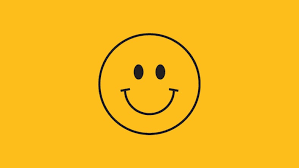

In [281]:
sample1 = 'I like this move'
predict_sentiment(sample1)

1/1 [==============================] - 0s 41ms/step
           Negative


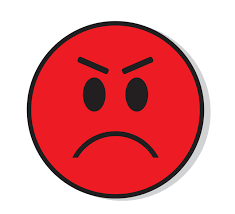

In [282]:
sample3 = "I don't like this move"
predict_sentiment(sample3)

                                                                        :)